In [2]:
import argparse
import gzip
import json
import os.path
from typing import List
import itertools
import os
import geoip2.database
import pandas as pd
from geoip2.database import MODE_MEMORY
from bs4 import BeautifulSoup
import pandas as pd


In [ ]:
# first, process run data
directory = 'google_results_up_to'
res_df = pd.DataFrame()#.from_dict(res)

files = os.listdir(directory)
for f in files:
    # checking if it is a file
    if os.path.isfile(f):
        with open (f, 'rt') as fi:
            res = json.load(fi)
            res_df = pd.concat([res_df, pd.DataFrame().from_dict(res)])
res_df = res_df.drop_duplicates(subset=['for_query','title','links'])
old_res_df = pd.read_csv('google_scrape_results.csv')
res_df = pd.concat([res_df, old_res_df])
df = res_df.drop_duplicates(subset=['for_query','title','links'])
df.to_csv('google_scrape_results.csv',index=False)

In [23]:
# @title Cleaning Functions
def maxmind_reader(filepath: str) -> geoip2.database.Reader:
  """Return Maxmind reader for .mmdb files."""
  if not os.path.exists(filepath):
    return
  return geoip2.database.Reader(filepath)

def get_lines_from_file(filename: str) -> List[str]:
    """Get lines from uncompressed input files."""
    with open(filename) as f:
            return [line.strip() for line in f]

def get_path(input_directory, filename):
    """Return full path for an input file."""
    full_path = os.path.join(input_directory, filename)
    print("full path: "+full_path)
    if os.path.exists(full_path):
        return full_path

def process_zgrab(zgrab_lines):
    """Process TCP/TLS/HTTP records from geoinspector into a flat tabular format.
        The input data is structured: : {
          Endpoint: {Domain, Ip}
          Responses: [
            {
              Startime, Endtime, IsDomainIncluded, Version, HandshakeComplete (TLS)
              HTTPResponseHeaders: {status_line, status_code}
              HTTPResponseBody
            }
          ]
        }"""

    flattened_zgrab = {}
    flat=''
    for line in zgrab_lines:
        measurement = json.loads(line)
        flat = {
           'domain': measurement['Endpoint']['Domain'],
            'parsed_body': ''
        }
        answers = measurement['Responses']
        if len(answers) == 0:
          # flat['status'] = 'FAIL'
          continue
        for response in answers:
          respheader = response['HTTPResponseHeaders']
          if respheader is not None :
            if 'status_code' in respheader.keys():
              if respheader['status_code'] == 200 and str(response['IsDomainIncluded']) == 'True':
                parsed_body = str(BeautifulSoup(response['HTTPResponseBody'],'html.parser').get_text()).replace('\n','').replace(',','').replace('\r','').replace('\\','')
                parsed_body = bytes(parsed_body, 'utf-8').decode('utf-8', 'ignore')
                flat['parsed_body'] = parsed_body
                flattened_zgrab[flat['domain']] = flat['parsed_body']
                with open('pages/'+flat['domain']+'.html','w+') as f:
                    f.write(response['HTTPResponseBody'])
                    
    
    with open('parsed_pages.jsonl','wt') as f:
       f.write(json.dumps(flattened_zgrab))
    return flattened_zgrab



In [24]:
tcp = get_path('', 'tcp_output.json')
tcp_lines = get_lines_from_file(tcp)
tcp_df = process_zgrab(tcp_lines)

full path: tcp_output.json


In [25]:
with open('parsed_pages.jsonl','rt') as f:
    x = json.load(f)

In [39]:
x

{'dictionary.cambridge.org': "Cambridge Dictionary | English Dictionary Translations & Thesaurus   DictionaryTranslateGrammarThesaurus+PlusCambridge Dictionary +PlusCambridge Dictionary +PlusMy profile+Plus helpLog outCambridge Dictionary +PlusMy profile+Plus helpLog outLog in / Sign upEnglish (UK)Make your words meaningful                                                            English                                                Explore the Cambridge DictionaryEnglish dictionariesEnglishLearner’s DictionaryEssential British EnglishEssential American EnglishGrammarThesaurusPronunciationTranslation dictionaries                                    Click on the arrows to change the translation direction.                                English–Chinese (Simplified)Chinese (Simplified)–EnglishEnglish–Chinese (Traditional)Chinese (Traditional)–EnglishEnglish–DutchDutch–EnglishEnglish–FrenchFrench–EnglishEnglish–GermanGerman–EnglishSee moreSee lessEnglish–IndonesianIndonesian–EnglishEngli

In [13]:
df = pd.read_csv('google_scrape_results.csv') # if not read already

In [14]:
df

,for_query,title,snippet,rank,links,country
0,погода,Прогноз погоды на 10 дней,Погода на 10 дней ; ср. сегодня. +20° ; чт. 09...,1,https://yandex.ru/pogoda,ru
1,погода,Город Маунтин-Вью,Погода на 10 дней ; чт. сегодня. +19° ; пт. 10...,2,https://yandex.ru/pogoda/mountain-view,ru
2,погода,"GISMETEO: Погода в России, прогноз погоды на с...",Текущая погода и точный прогноз по всем населе...,3,https://www.gismeteo.ru/,ru
3,погода,Погода в Набережных Челнах,NaN,4,https://www.gismeteo.ru/weather-naberezhnye-ch...,ru
4,погода,Погода в Краснодаре,"Погода в Краснодаре на сегодня, точный прогноз...",5,https://www.gismeteo.ru/weather-krasnodar-5136/,ru
...,...,...,...,...,...,...
1032,сбербанк,Работа в Сбере,... обработки данных · Политика использования ...,28,https://rabota.sber.ru/,us
1033,сбербанк,Сбербанк страхование,Сбербанк Страхование предлагает широкий спектр...,29,https://sberbankins.ru/,us
1034,сбербанк,Сбербанк-АСТ,NaN,30,https://sberbank-ast.ru/,us
1035,сбербанк,Spear's Russia. Private Banking & Wealth Manag...,NaN,34,https://books.google.com/books?id=F5cnCAAAQBAJ...,us


In [15]:
df['for_query'].nunique()

39

In [17]:
qset = set(df[df['country']=='us']['for_query'])& set(df[df['country']=='ru']['for_query'])

In [18]:
df[df['for_query'].isin(qset)].nunique()

for_query     28
title        690
snippet      479
rank          43
links        759
country        2
dtype: int64

In [61]:
df['doc'] = ''
df['parsed_link'] = ''

In [62]:
for i, row in df.iterrows():
    dom = row['links'].replace('https://','').split('/')[0]
    # print(dom)
    if dom in x.keys():
        df.loc[i, 'doc'] = x[dom]
        df.loc[i, 'parsed_link'] = dom

In [63]:
df#['doc']

,for_query,title,snippet,rank,links,country,doc,parsed_link
0,погода,Прогноз погоды на 10 дней,Погода на 10 дней ; ср. сегодня. +20° ; чт. 09...,1,https://yandex.ru/pogoda,ru,Ой!Подтвердите что запросы отправляли вы а не ...,yandex.ru
1,погода,Город Маунтин-Вью,Погода на 10 дней ; чт. сегодня. +19° ; пт. 10...,2,https://yandex.ru/pogoda/mountain-view,ru,Ой!Подтвердите что запросы отправляли вы а не ...,yandex.ru
2,погода,"GISMETEO: Погода в России, прогноз погоды на с...",Текущая погода и точный прогноз по всем населе...,3,https://www.gismeteo.ru/,ru,GISMETEO: Погода в России прогноз погоды на се...,www.gismeteo.ru
3,погода,Погода в Набережных Челнах,NaN,4,https://www.gismeteo.ru/weather-naberezhnye-ch...,ru,GISMETEO: Погода в России прогноз погоды на се...,www.gismeteo.ru
4,погода,Погода в Краснодаре,"Погода в Краснодаре на сегодня, точный прогноз...",5,https://www.gismeteo.ru/weather-krasnodar-5136/,ru,GISMETEO: Погода в России прогноз погоды на се...,www.gismeteo.ru
...,...,...,...,...,...,...,...,...
1032,сбербанк,Работа в Сбере,... обработки данных · Политика использования ...,28,https://rabota.sber.ru/,us,Работа в СбереВакансииКарьерные медиаВыпускник...,rabota.sber.ru
1033,сбербанк,Сбербанк страхование,Сбербанк Страхование предлагает широкий спектр...,29,https://sberbankins.ru/,us,,
1034,сбербанк,Сбербанк-АСТ,NaN,30,https://sberbank-ast.ru/,us,,
1035,сбербанк,Spear's Russia. Private Banking & Wealth Manag...,NaN,34,https://books.google.com/books?id=F5cnCAAAQBAJ...,us,Google BooksSearchImagesMapsPlayYouTubeNewsGma...,books.google.com


In [80]:
from googletrans import Translator, constants
translator = Translator()

In [86]:
user_agent_list = [
    'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/93.0.4577.82 Safari/537.36',
    'Mozilla/5.0 (iPhone; CPU iPhone OS 14_4_2 like Mac OS X) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/14.0.3 Mobile/15E148 Safari/604.1',
    'Mozilla/4.0 (compatible; MSIE 9.0; Windows NT 6.1)',
    'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/87.0.4280.141 Safari/537.36 Edg/87.0.664.75',
    'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/70.0.3538.102 Safari/537.36 Edge/18.18363',
    "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/13.0.5 Safari/605.1.15",
    "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/103.0.5060.53 Safari/537.36",
    "Mozilla/5.0 (Windows NT 10.0; Windows; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/103.0.5060.114 Safari/537.36",
    "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_10_5) AppleWebKit/603.3.8 (KHTML, like Gecko) Version/10.1.2 Safari/603.3.8",
    "Mozilla/5.0 (Windows NT 10.0; Windows; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/103.0.5060.114 Safari/537.36",
    "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/14.0 Safari/605.1.15",
    "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/103.0.5060.53 Safari/537.36",
    "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_6) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/14.0 Safari/605.1.15",
    "Mozilla/5.0 (Windows NT 10.0; Windows; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/103.0.5060.114 Safari/537.36",
    "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/103.0.5060.53 Safari/537.36"
]

In [103]:
row = df.iloc[3]
text = str(row['for_query']) + '____' +str(row['title']) + '____' + str(row['snippet']) + '____' + str(row['doc'])

In [104]:
len(text)

4310

In [101]:
translation = translator.translate(text)
translation

In [102]:
translation.text

'weather ____ Weather in Naberezhnye Chelny ____ Nan'

In [88]:
from random import randint
import time

In [105]:
# add in 
full_translated = {}
tdict_list = []

In [115]:
for i, row in df.iterrows():
    if i < 151:
        continue
    text = str(row['for_query']) + '____' +str(row['title']) + '____' + str(row['snippet']) + '____' + str(row['doc'])
    if len(text) > 2500:
        text = str(row['for_query']) + '____' +str(row['title']) + '____' + str(row['snippet']) 
    useragent = user_agent_list[randint(0, len(user_agent_list)-1)]
    translation =  translator.translate(text, user_agent=useragent,src='ru',dest='en')
    tlist = translation.text.split('____')
    print(tlist)
    cols = ['for_query', 'title','snippet','doc']
    for j in range(len(tlist)):
        row[cols[j]] = tlist[j]

    full_translated[text] = (translation.text, translation.extra_data)
    r = row.to_dict()
    tdict_list.append(r)
    time.sleep(20)


['diary ru ___ Journal Dnevnik.ru 4+ - App Store - Apple __nan']
['diary ru', 'Diary ru - Student’s personal account: login to My ...', 'Dnevnik.ru allows teachers to organize distance learning and transfer “paper” aspects of their work into electronic form, parents - to monitor...']
['diary ru', 'Dnevnik.ru', 'Dnevnik.ru is a Russian IT company in the field of educational technologies. According to its own statements, the company is developing a unified electronic...']
['diary ru', 'Dnevnik.ru - encyclopedia "Knowledge.Wiki"', 'Oct 5 2023 —']
['diary ru', 'Dnevnik.ru Company - Habr Career', 'Dnevnik.ru Company - employer profile on Habr Career: about the company, office photos, contacts.']
['diary ru', 'Dnevnik.ru', 'nan', 'Update Your Browser | FacebookUpdate Your BrowserYou’re using a web browser that isn’t supported by Facebook.To get a better experience go to one of these sites and get the latest version of your preferred browser:Google ChromeMozilla FirefoxGet Facebook on Your Ph

In [117]:
len(tdict_list)

1036

In [116]:
len(full_translated.keys())

1004

In [120]:
pd.DataFrame(tdict_list).to_csv('translated_df_with_parses.csv',index=False)

In [112]:
stl = tdict_list.copy()
sft = full_translated.copy()

In [69]:
df.to_csv('df_with_parses.csv', index=False, escapechar='"')
# TODO translate: https://pypi.org/project/googletrans/

In [122]:
full_translated

{'погода____Прогноз погоды на 10 дней____Погода на 10 дней ; ср. сегодня. +20° ; чт. 09. +19° ; пт. 10. +19° ; сб. 11. +20° ; вс. 12. +22°\xa0...____Ой!Подтвердите что запросы отправляли вы а не роботНам очень жаль но запросы с вашего устройства похожи на автоматические.\xa0 \xa0Почему это могло произойти?У вас отключено исполнение JavaScript. По нажатию вы будете направлены на дополнительную проверку.\xa0Как включить JavaScript?Я не роботНажмите чтобы продолжитьSmartCaptcha by Yandex CloudSmartCaptcha нужна проверка пользователяЕсли у вас возникли проблемы пожалуйста воспользуйтесь\xa0формой обратной связи': ("weather____Weather forecast for 10 days____Weather for 10 days; Wed Today. +20° ; Thurs. 09. +19°; Fri. 10. +19°; Sat. 11. +20° ; Sun. 12. +22°...____Oh! Confirm that you sent the requests and not a robot. We are very sorry, but the requests from your device look like automatic ones. Why might this happen?You have JavaScript disabled. Upon clicking, you will be directed to addit

In [121]:
with open('full_translation_info.jsonl', 'wt') as f:
    f.write(json.dumps(full_translated))

In [58]:
queries = set(df[df['country']=='us']['for_query'])& set(df[df['country']=='ru']['for_query'])

In [3]:
ttf = pd.read_csv('translated_df_with_parses.csv')
ttf['ru']

,for_query,title,snippet,rank,links,country,doc,parsed_link
0,weather,Weather forecast for 10 days,Weather for 10 days; Wed Today. +20° ; Thurs. ...,1,https://yandex.ru/pogoda,ru,Oh! Confirm that you sent the requests and not...,yandex.ru
1,weather,City of Mountain View,Weather for 10 days; Thurs. Today. +19° ; Fri....,2,https://yandex.ru/pogoda/mountain-view,ru,Oh! Confirm that you sent the requests and not...,yandex.ru
2,weather,"GISMETEO: Weather in Russia, weather forecast ...",Current weather and accurate forecast for all ...,3,https://www.gismeteo.ru/,ru,GISMETEO: Погода в России прогноз погоды на се...,www.gismeteo.ru
3,weather,Weather in Naberezhnye Chelny,Nan,4,https://www.gismeteo.ru/weather-naberezhnye-ch...,ru,GISMETEO: Погода в России прогноз погоды на се...,www.gismeteo.ru
4,weather,Weather in Krasnodar,"Weather in Krasnodar for today, accurate weath...",5,https://www.gismeteo.ru/weather-krasnodar-5136/,ru,GISMETEO: Погода в России прогноз погоды на се...,www.gismeteo.ru
...,...,...,...,...,...,...,...,...
1031,Sberbank,Work at Sberbank,... data processing · Cookies Policy. © 2023 S...,28,https://rabota.sber.ru/,us,Работа в СбереВакансииКарьерные медиаВыпускник...,rabota.sber.ru
1032,Sberbank,Sberbank Insurance,Sberbank Insurance offers a wide range of insu...,29,https://sberbankins.ru/,us,NaN,NaN
1033,Sberbank,Sberbank-AST,ann,30,https://sberbank-ast.ru/,us,NaN,NaN
1034,Sberbank,Spear's Russia. Private Banking & Wealth Manag...,NaN,34,https://books.google.com/books?id=F5cnCAAAQBAJ...,us,Google BooksSearchImagesMapsPlayYouTubeNewsGma...,books.google.com


In [12]:
ttf['for_query'].unique()

array(['weather', 'weather ', 'gdz', 'GDZ', 'gdz ', 'vk', 'VK ', 'VK',
       'translator', 'translator ', 'YouTube', 'YouTube ', 'Avito',
       'Avito ', 'avito', 'ozone', 'ozone ', 'ozon', 'classmates',
       'Odnoklassniki', 'diary ru',
       'diary ru ___ Journal Dnevnik.ru 4+ - App Store - Apple __nan',
       'diary ru ', 'dns', 'valberis',
       'valberis Wildberries - Apps on Google Play __nan', 'valberis ',
       'valberis _ Download Wildberries 5.3.6001 for Android - Trashbox _3 days ago —',
       'wildberries',
       'wildberries Wildberries - Apps on Google Play __nan',
       'wildberries ', 'wildberry', 'Sberbank online', 'Sberbank online ',
       'Sberbank online _ SberBank Online APK for Android - Download _ July 10. 2023 —',
       'Sberbank online ___ Sberbank Online" application reappeared in the App ...___ 10 Oct. 2022 —',
       'calculator', 'calculator ', 'VKontakte',
       'VKontakte _ Urgently go public! 5 communities about proper nutrition _2 days ago

In [ ]:
df = pd.read_csv('google_scrape_results.csv') # if not read already

In [19]:
with open('full_translation_info.jsonl', 'rt') as f:
    full_translated = json.load(f)

In [49]:
translation_dict = {}
listtt = []
for data, tr in full_translated.items():
    # translation in tr['translation']
    dlist = data.split('____')
    trlist = tr[0].split('____')
    translation_dict[data] = tr[0]
    if(len(dlist) != len(trlist)):
    #     # handle breakage
    #     if dlist[0] == 'дневник ру':
    #         trlist = trlist[0].split('___').strip('__nan')
    #     elif dlist[0] == 'валберис':
    #         trlist = 'valberis' + trlist.split('valberis')[1].split('_')
    #     elif dlist[0] == 'сбербанк онлайн':
    #         if len(trlist) == 1:
    #             trlist = trlist[0] + trlist[1].split('_')
    #         else:
    #             trlist = trlist.split('_')

        print(data)
        print(dlist)
        print(tr[0])
        print(trlist)
    dlist += [' x ']*(len(dlist)-4)
    trlist += [' x ']*(len(trlist)-4)
    listtt.append(dlist + trlist)


дневник ру____Журнал Дневник.ру 4+ - App Store - Apple____nan
['дневник ру', 'Журнал Дневник.ру 4+ - App Store - Apple', 'nan']
diary ru ___ Journal Dnevnik.ru 4+ - App Store - Apple __nan
['diary ru ___ Journal Dnevnik.ru 4+ - App Store - Apple __nan']
валберис____Wildberries - Приложения в Google Play____nan
['валберис', 'Wildberries - Приложения в Google Play', 'nan']
valberis Wildberries - Apps on Google Play __nan
['valberis Wildberries - Apps on Google Play __nan']
валберис____Скачать Wildberries 5.3.6001 для Android - Trashbox____3 дня назад — 
['валберис', 'Скачать Wildberries 5.3.6001 для Android - Trashbox', '3 дня назад — ']
valberis _ Download Wildberries 5.3.6001 for Android - Trashbox _3 days ago —
['valberis _ Download Wildberries 5.3.6001 for Android - Trashbox _3 days ago —']
валберис____Валберис-нет. - Wildberries.ru____8 сент. 2023 г. — 
['валберис', 'Валберис-нет. - Wildberries.ru', '8 сент. 2023\u202fг. — ']
valberis ____ Valberis-no. - Wildberries.ru __ Sep 8 2023

In [42]:
pd.DataFrame().from_records(listtt, columns=['query_ru','title_ru','snippet_ru','doc_ru','query_en','title_en','snippet_en','doc_en']).to_csv('translation.csv',index=False)

In [45]:
x = pd.read_csv('df_with_parses.csv')
x

,for_query,title,snippet,rank,links,country,doc,parsed_link
0,погода,Прогноз погоды на 10 дней,Погода на 10 дней ; ср. сегодня. +20° ; чт. 09...,1,https://yandex.ru/pogoda,ru,Ой!Подтвердите что запросы отправляли вы а не ...,yandex.ru
1,погода,Город Маунтин-Вью,Погода на 10 дней ; чт. сегодня. +19° ; пт. 10...,2,https://yandex.ru/pogoda/mountain-view,ru,Ой!Подтвердите что запросы отправляли вы а не ...,yandex.ru
2,погода,"GISMETEO: Погода в России, прогноз погоды на с...",Текущая погода и точный прогноз по всем населе...,3,https://www.gismeteo.ru/,ru,GISMETEO: Погода в России прогноз погоды на се...,www.gismeteo.ru
3,погода,Погода в Набережных Челнах,NaN,4,https://www.gismeteo.ru/weather-naberezhnye-ch...,ru,GISMETEO: Погода в России прогноз погоды на се...,www.gismeteo.ru
4,погода,Погода в Краснодаре,"Погода в Краснодаре на сегодня, точный прогноз...",5,https://www.gismeteo.ru/weather-krasnodar-5136/,ru,GISMETEO: Погода в России прогноз погоды на се...,www.gismeteo.ru
...,...,...,...,...,...,...,...,...
1032,сбербанк,Работа в Сбере,... обработки данных · Политика использования ...,28,https://rabota.sber.ru/,us,Работа в СбереВакансииКарьерные медиаВыпускник...,rabota.sber.ru
1033,сбербанк,Сбербанк страхование,Сбербанк Страхование предлагает широкий спектр...,29,https://sberbankins.ru/,us,NaN,NaN
1034,сбербанк,Сбербанк-АСТ,NaN,30,https://sberbank-ast.ru/,us,NaN,NaN
1035,сбербанк,Spear's Russia. Private Banking & Wealth Manag...,NaN,34,https://books.google.com/books?id=F5cnCAAAQBAJ...,us,Google BooksSearchImagesMapsPlayYouTubeNewsGma...,books.google.com


In [46]:
x['for_query'].nunique()

39

In [53]:
# with open('full_translation_info.jsonl', 'rt') as f:
#     full_translated = json.load(f)


    
def get_unparsed_translation(row):
    text = str(row['for_query']) + '____' +str(row['title']) + '____' + str(row['snippet']) + '____' + str(row['doc'])
    if len(text) > 2500:
        text = str(row['for_query']) + '____' +str(row['title']) + '____' + str(row['snippet']) 
    
    tres = translation_dict.get(text, 'translation_error') # it is corrupted so .split('____') so may not correspond 1 - 1 - one
    return tres.replace('_',' ').replace('nan',' ')

x['bow_translation'] = x.apply(get_unparsed_translation, axis=1)
    

In [60]:
x.index

RangeIndex(start=0, stop=1037, step=1)

In [62]:
x#['index'] = x.index

,for_query,title,snippet,rank,links,country,doc,parsed_link,bow_translation,index
0,погода,Прогноз погоды на 10 дней,Погода на 10 дней ; ср. сегодня. +20° ; чт. 09...,1,https://yandex.ru/pogoda,ru,Ой!Подтвердите что запросы отправляли вы а не ...,yandex.ru,weather Weather forecast for 10 days Wea...,0
1,погода,Город Маунтин-Вью,Погода на 10 дней ; чт. сегодня. +19° ; пт. 10...,2,https://yandex.ru/pogoda/mountain-view,ru,Ой!Подтвердите что запросы отправляли вы а не ...,yandex.ru,weather City of Mountain View Weather fo...,1
2,погода,"GISMETEO: Погода в России, прогноз погоды на с...",Текущая погода и точный прогноз по всем населе...,3,https://www.gismeteo.ru/,ru,GISMETEO: Погода в России прогноз погоды на се...,www.gismeteo.ru,"weather GISMETEO: Weather in Russia, weathe...",2
3,погода,Погода в Набережных Челнах,NaN,4,https://www.gismeteo.ru/weather-naberezhnye-ch...,ru,GISMETEO: Погода в России прогноз погоды на се...,www.gismeteo.ru,weather Weather in Naberezhnye Chelny ...,3
4,погода,Погода в Краснодаре,"Погода в Краснодаре на сегодня, точный прогноз...",5,https://www.gismeteo.ru/weather-krasnodar-5136/,ru,GISMETEO: Погода в России прогноз погоды на се...,www.gismeteo.ru,weather Weather in Krasnodar Weather in ...,4
...,...,...,...,...,...,...,...,...,...,...
1032,сбербанк,Работа в Сбере,... обработки данных · Политика использования ...,28,https://rabota.sber.ru/,us,Работа в СбереВакансииКарьерные медиаВыпускник...,rabota.sber.ru,Sberbank Work at Sberbank ... data proce...,1032
1033,сбербанк,Сбербанк страхование,Сбербанк Страхование предлагает широкий спектр...,29,https://sberbankins.ru/,us,NaN,NaN,translation error,1033
1034,сбербанк,Сбербанк-АСТ,NaN,30,https://sberbank-ast.ru/,us,NaN,NaN,translation error,1034
1035,сбербанк,Spear's Russia. Private Banking & Wealth Manag...,NaN,34,https://books.google.com/books?id=F5cnCAAAQBAJ...,us,Google BooksSearchImagesMapsPlayYouTubeNewsGma...,books.google.com,Sberbank Spear's Russia. Private Banking & ...,1035


In [85]:
from random import randint

In [106]:
def baseline_ranker(q, x):
    us = x[(x['for_query']==q) & (x['country']=='us')]
    ru = x[(x['for_query']==q) & (x['country']=='ru')]
    idx_scores = []
    print('for query:', q)
    for i,row in us.iterrows():
        toks = ' '.join(row['bow']).split(' ') #(' '.join(row['title_en']) +  ' '.join(row['snippet_en']) + ' '.join(row['doc_en'])).split(' ') 
        tok_bucket = ' '.join(ru['bow']).split(' ') #(' '.join(ru['title_en']) +  ' '.join(ru['snippet_en']) + ' '.join(ru['doc_en'])).split(' ') 
        no_overlap = set(toks) - set(tok_bucket)
        idx_scores.append((row['index'], 'us', row['title_en'][:25],(len(no_overlap) / len(toks)) * 5))

    for i,row in ru.iterrows():
        toks = ' '.join(row['bow']).split(' ') #(' '.join(row['title_en']) +  ' '.join(row['snippet_en']) + ' '.join(row['doc_en'])).split(' ') 
        tok_bucket = ' '.join(us['bow']).split(' ')#(' '.join(us['title_en']) +  ' '.join(us['snippet_en']) + ' '.join(us['doc_en'])).split(' ') 
        no_overlap = set(toks) - set(tok_bucket)
        idx_scores.append((row['index'], 'ru',row['title_en'][:25], (len(no_overlap) / len(toks)) * 5))

    return sorted(idx_scores, key=lambda x: x[3], reverse=True)

In [133]:
x = ann_df.copy()
full_idx_scores = []
for q in queries_ann:
    # get slice
    us = x[(x['for_query']==q) & (x['country']=='us')]
    ru = x[(x['for_query']==q) & (x['country']=='ru')]
    idx_scores = []
    full_idx_scores += baseline_ranker(q,x)




for query: youtube
for query: гдз
for query: дневник ру
for query: гипсофилы
for query: днс
for query: вконтакте
for query: авито
for query: аватар 2
for query: atomic heart
for query: вайлдберриз
for query: вк
for query: валберис
for query: госуслуги
for query: chatgpt
for query: инна чурикова


In [105]:
ann_df.head(5)[['index','bow']]

,index,bow
0,0,0 Atomic Heart – At...
1,1,0 Atomic Heart – At...
2,2,0 Atomic Heart – At...
3,3,0 Atomic Heart – At...
4,4,0 Atomic Heart – At...


In [136]:
discdf = pd.DataFrame().from_records(full_idx_scores, columns=['index','country','bow','discordance'])

In [88]:
ann_df = pd.read_csv('bag_of_words_translated - temp for figs.csv')

In [102]:
ann_df['bow'] = str(ann_df['title_en']) + str(ann_df['snippet_en']) + str(ann_df['doc_en'])

In [98]:
queries_ann = set(ann_df['for_query'])

In [96]:
from sklearn.metrics import ndcg_score, average_precision_score

In [111]:
import numpy as np

In [ ]:
def get_com

In [119]:
ann_df['index'] = ann_df.index
base_rec = []
for q in queries_ann:
    # baseline DOES NOT ACTUALLY USE DISC SCORES FROM ANN DF
    baseline = baseline_ranker(q, ann_df)
    truth = ann_df[ann_df['for_query']==q]['discordance'] # when 3 or above
    truth = sorted(truth, reverse=True)
    mp = average_precision_score([1 if t > 2 else 0 for t in truth ], [1 if b[3] > 2 else 0 for b in baseline ])

    ng = ndcg_score(np.asarray([truth]), np.asarray([[b[3] for b in baseline]]) )
    base_rec.append([q, 'map',mp])
    base_rec.append([q, 'ndcg',ng])

basedf = pd.DataFrame().from_records(base_rec, columns=['query','score','value'])

for query: youtube
for query: гдз
for query: дневник ру
for query: гипсофилы
for query: днс
for query: вконтакте
for query: авито
for query: аватар 2
for query: atomic heart
for query: вайлдберриз


/usr/local/lib/python3.11/site-packages/sklearn/metrics/_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


for query: вк
for query: валберис
for query: госуслуги
for query: chatgpt
for query: инна чурикова


/usr/local/lib/python3.11/site-packages/sklearn/metrics/_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


In [79]:
import seaborn as sns

[Text(0.5, 1.0, 'MAP and NDCG Scores for Discordance Baseline')]

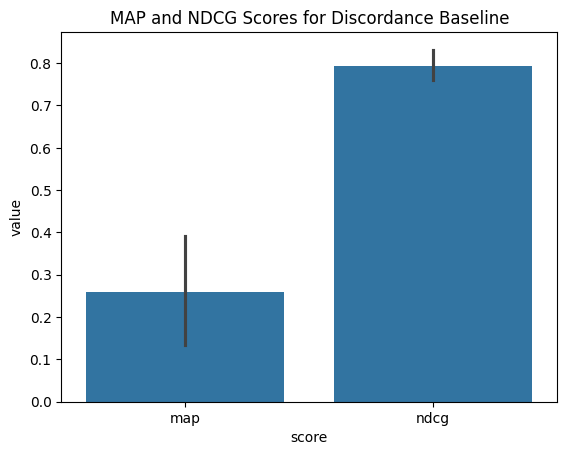

In [132]:
sns.barplot(basedf, x='score',y='value').set(title='MAP and NDCG Scores for Discordance Baseline')

In [123]:
import matplotlib.pyplot as plt

[Text(0.5, 1.0, 'MAP and NDCG Scores for Discordance Baseline - Annotated Subset')]

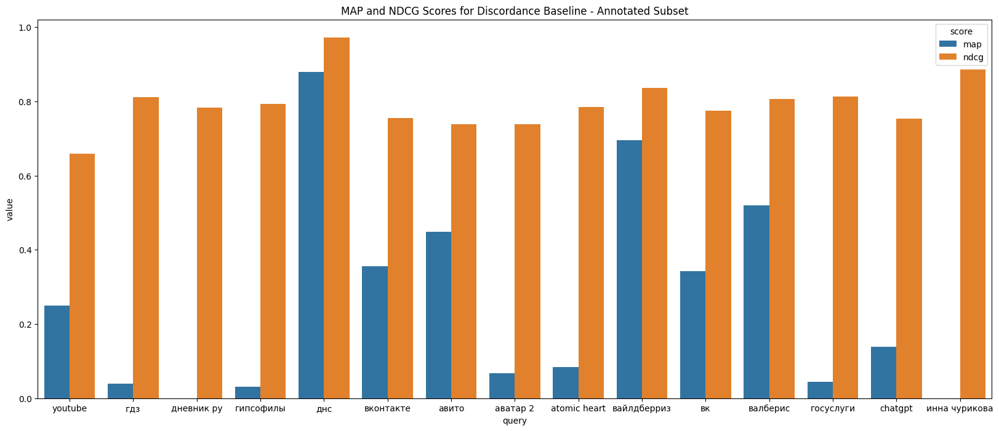

In [130]:
plt.figure(figsize=(20,8))
sns.barplot(basedf, x='query',hue='score', y='value').set(title='MAP and NDCG Scores for Discordance Baseline - Annotated Subset',)

In [128]:

q = 'днс'
baseline = baseline_ranker(q, ann_df)
truth = ann_df[ann_df['for_query']==q]['discordance'] # when 3 or above
truth = sorted(truth, reverse=True)

for query: днс


In [129]:
baseline

[(376, 'us', 'Public DNS | Google for D', 0.1373717312148295),
 (377, 'us', 'Get Started | Public DNS', 0.1373717312148295),
 (378, 'us', 'What is DNS? | How DNS wo', 0.1373717312148295),
 (379, 'us', 'Cloud DNS', 0.1373717312148295),
 (380, 'us', 'What is DNS? – Introducti', 0.1373717312148295),
 (381, 'us', 'Quad9 | A public and free', 0.1373717312148295),
 (382, 'us', 'DNS Lookup Tool', 0.1373717312148295),
 (383, 'us', 'DNS leak test', 0.1373717312148295),
 (384, 'us', 'DNS Made Easy | Fast and ', 0.1373717312148295),
 (385, 'us', "GRC's | DNS Nameserver Pe", 0.1373717312148295),
 (386, 'us', 'DNS Propagation Checker -', 0.1373717312148295),
 (387, 'us', 'What is DNS? | Domains - ', 0.1373717312148295),
 (388, 'us', 'Cloud Delivered Enterpris', 0.1373717312148295),
 (389, 'us', 'DNS SHOP - Apps on Google', 0.1373717312148295),
 (390, 'us', 'DNS Performance - Compare', 0.1373717312148295),
 (391, 'us', "the Internet's Fastest, P", 0.1373717312148295),
 (359, 'ru', 'DNS - online stor

[Text(0.5, 1.0, 'Annotated Discordance ECDF')]

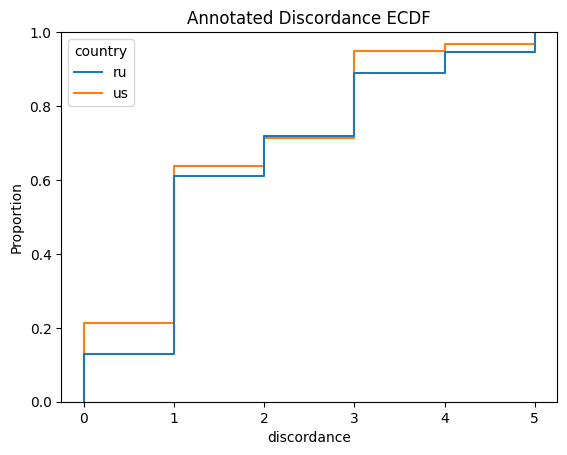

In [135]:
sns.ecdfplot(ann_df, x='discordance',hue='country').set(title='Annotated Discordance ECDF')

[Text(0.5, 1.0, 'Baseline Discordance ECDF')]

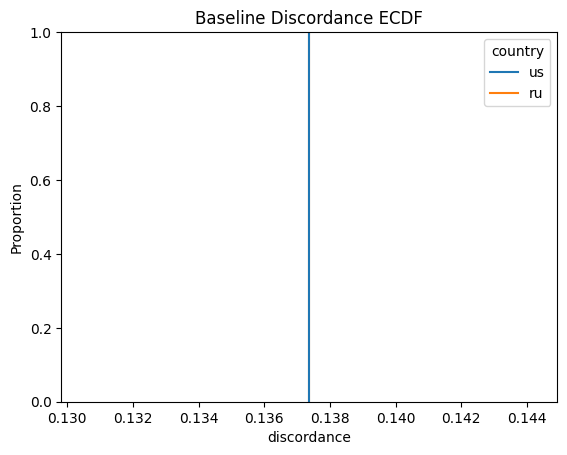

In [137]:
sns.ecdfplot(discdf, x='discordance',hue='country').set(title='Baseline Discordance ECDF')

In [63]:
x.to_csv('bag_of_words_translated.csv', index=False)

In [57]:
pd.read_csv('bag_of_words_translated.csv')['for_query'].nunique()

39

In [47]:
for i, row in x.iterrows():
    text = str(row['for_query']) + '____' +str(row['title']) + '____' + str(row['snippet']) + '____' + str(row['doc'])
    if len(text) > 2500:
        text = str(row['for_query']) + '____' +str(row['title']) + '____' + str(row['snippet']) 
    
    tlist = text.split('____')
    trlist = translation_dict[text]
    print(trlist)
    if i ==10:
        break

weather____Weather forecast for 10 days____Weather for 10 days; Wed Today. +20° ; Thurs. 09. +19°; Fri. 10. +19°; Sat. 11. +20° ; Sun. 12. +22°...____Oh! Confirm that you sent the requests and not a robot. We are very sorry, but the requests from your device look like automatic ones. Why might this happen?You have JavaScript disabled. Upon clicking, you will be directed to additional verification. How to enable JavaScript?I'm not a robotClick to continueSmartCaptcha by Yandex CloudSmartCaptcha requires user verificationIf you have any problems please use the feedback form
weather____City of Mountain View____Weather for 10 days; Thurs. Today. +19° ; Fri. 10. +20° ; Sat. 11. +20° ; Sun. 12. +22°; Mon. 13. +19°...____Oh! Confirm that you sent the requests and not a robot. We are very sorry, but the requests from your device look like automatic ones. Why might this happen?You have JavaScript disabled. Upon clicking, you will be directed to additional verification. How to enable JavaScript?

In [36]:
full_translated

{'погода____Прогноз погоды на 10 дней____Погода на 10 дней ; ср. сегодня. +20° ; чт. 09. +19° ; пт. 10. +19° ; сб. 11. +20° ; вс. 12. +22°\xa0...____Ой!Подтвердите что запросы отправляли вы а не роботНам очень жаль но запросы с вашего устройства похожи на автоматические.\xa0 \xa0Почему это могло произойти?У вас отключено исполнение JavaScript. По нажатию вы будете направлены на дополнительную проверку.\xa0Как включить JavaScript?Я не роботНажмите чтобы продолжитьSmartCaptcha by Yandex CloudSmartCaptcha нужна проверка пользователяЕсли у вас возникли проблемы пожалуйста воспользуйтесь\xa0формой обратной связи': ["weather____Weather forecast for 10 days____Weather for 10 days; Wed Today. +20° ; Thurs. 09. +19°; Fri. 10. +19°; Sat. 11. +20° ; Sun. 12. +22°...____Oh! Confirm that you sent the requests and not a robot. We are very sorry, but the requests from your device look like automatic ones. Why might this happen?You have JavaScript disabled. Upon clicking, you will be directed to addit